In [1]:
import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

## Download

### Download data via script

In [2]:
%cd ~/projects/dd-biomassters/pix2pix/
!python datasets/biomassters_downloader.py \
    --phase validation \
    --dataroot ../data \
    --dataset_size 32 \
    --metadata_file ../data/metadata/features_metadata_split_42.csv \
    --random_state 5

/Users/loaner/projects/dd-biomassters/pix2pix
0 163e6988
1 84db2ccd
2 06137b43
3 ecce62ba
4 b6afed20
5 7892d2cb
6 d1e12c6c
7 8d2eff52
8 011909e9
9 96fae87e
10 12b8cf9c
11 254ec31f
12 78016bed
13 d2968ab2
14 b81b6ecb
15 de4a69a3
16 3f3c2a5e
17 2441d664
18 65be5931
19 38aac3a8
20 70fca2ff
21 1f457003
22 5d0271e8
23 f9bb7806
24 f3d40af0
25 3a1e1537
26 4abdf19f
27 58c6c3a8
28 fce419af
29 afa7f357
30 497db42b
31 aeeef805


### Download data via module

In [3]:
%cd ~/projects/dd-biomassters/pix2pix/
from datasets.biomassters_downloader import BioMasstersDownloader

dd = BioMasstersDownloader(
    phase='validation', 
    dataroot='../data/', 
    dataset_size=32,
    metadata_file="../data/metadata/features_metadata_split_42.csv", 
    satellite=None,
    chip_is_complete=False, 
    is_imputable_s1=False,
    random_state=5)
dd.run()

/Users/loaner/projects/dd-biomassters/pix2pix
0 163e6988
1 84db2ccd
2 06137b43
3 ecce62ba
4 b6afed20
5 7892d2cb
6 d1e12c6c
7 8d2eff52
8 011909e9
9 96fae87e
10 12b8cf9c
11 254ec31f
12 78016bed
13 d2968ab2
14 b81b6ecb
15 de4a69a3
16 3f3c2a5e
17 2441d664
18 65be5931
19 38aac3a8
20 70fca2ff
21 1f457003
22 5d0271e8
23 f9bb7806
24 f3d40af0
25 3a1e1537
26 4abdf19f
27 58c6c3a8
28 fce419af
29 afa7f357
30 497db42b
31 aeeef805


## Load data

In [5]:
%cd ~/projects/dd-biomassters/pix2pix/
from data.biomassters_dataset import BioMasstersDataset

class DatasetOptions():
    def __init__(self):
        self.dataset_mode = 'biomassters'
        self.phase = 'validation'
        self.max_dataset_size = 32
        self.input_nc = 16
        self.dataroot = '../data'
        self.metadata_file = '../data/metadata/features_metadata_split_42.csv'
        self.satellite = None
        self.random_state = 5

opt = DatasetOptions()
dataset = BioMasstersDataset(opt)
dataset.load()

/Users/loaner/projects/dd-biomassters/pix2pix


### Visualize: Multiple chips for a given month

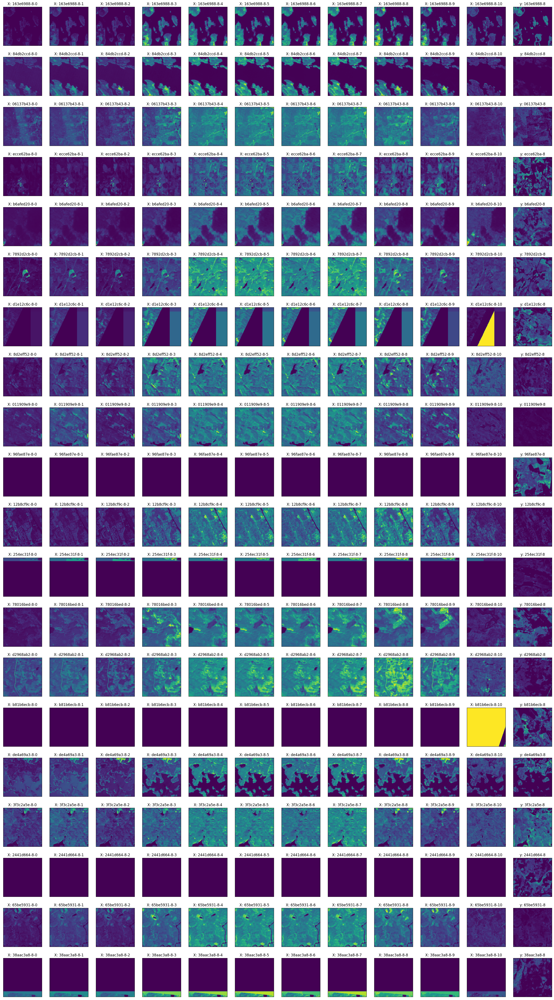

In [7]:
num_images = min(len(dataset.images), 20)
satellite = 2
month = 8
offset, num_channels = (48 + month * 11, 11) if satellite == 2 else (0 + month * 4, 4)

fig, axes = plt.subplots(nrows=num_images, ncols=num_channels+1, figsize=(3*num_channels,3*num_images))
axes = axes.flatten()
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

for i, data in enumerate(dataset.images[:num_images]):
    chip_id, X, y = data.values()
    for ch in range(num_channels):
        idx = i*(num_channels+1) + ch 
        axes[idx].imshow(X[:,:,ch + offset])
        axes[idx].set_title(f'X: {chip_id}-{month}-{ch}')
    axes[idx+1].imshow(y)
    axes[idx+1].set_title(f'y: {chip_id}-{month}')

### Visualize: Single chip across all months and channels

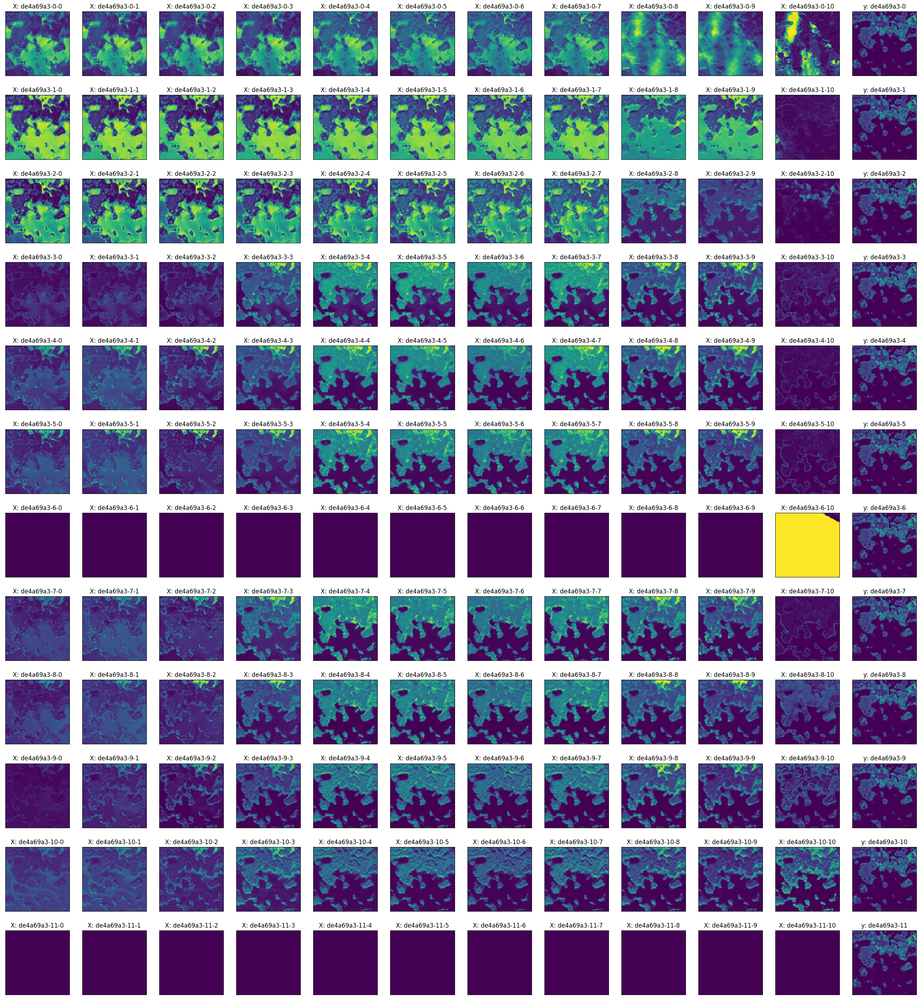

In [8]:
chip = dataset.chips.chip_id.values.tolist()[0]
chip = 'de4a69a3'
chip_data = [data for data in dataset.images if data['chip_id'] == chip][0]
chip_id, X, y = chip_data.values()

num_months = 12
satellite = 2
num_channels = 11 if satellite == 2 else 4

fig, axes = plt.subplots(nrows=num_months, ncols=num_channels+1, figsize=(3*num_channels,3*num_months))
axes = axes.flatten()
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

for month in range(num_months):
    offset = 48 + month * 11 if satellite == 2 else 0 + month * 4
    for ch in range(num_channels):
        idx = month*(num_channels+1) + ch 
        axes[idx].imshow(X[:,:,ch + offset])
        axes[idx].set_title(f'X: {chip_id}-{month}-{ch}')
    axes[idx+1].imshow(y)
    axes[idx+1].set_title(f'y: {chip_id}-{month}')

### Visualize: Pixel count histogram across channels

,channel,min,max,mean,std,median,p99
0,0,0.0,19008.0,1237.083760,2184.424826,258.0,9220.0
1,1,0.0,18032.0,1216.943810,1989.186165,395.0,8954.0
2,2,0.0,17120.0,1205.357163,2058.527346,307.0,9105.0
3,3,0.0,16622.0,1481.996191,2088.053597,701.0,9324.0
4,4,0.0,16628.0,2016.476357,2011.437369,1597.0,9102.0
5,5,0.0,16484.0,2137.606859,1952.055458,1829.0,8668.0
6,6,0.0,16321.0,2270.552951,2055.009380,1968.0,9152.0
7,7,0.0,16234.0,2231.657650,1913.684140,2018.0,8421.0
8,8,0.0,15402.0,893.655243,894.631358,721.0,4070.0
9,9,0.0,15228.0,597.450352,717.183008,428.0,3632.0


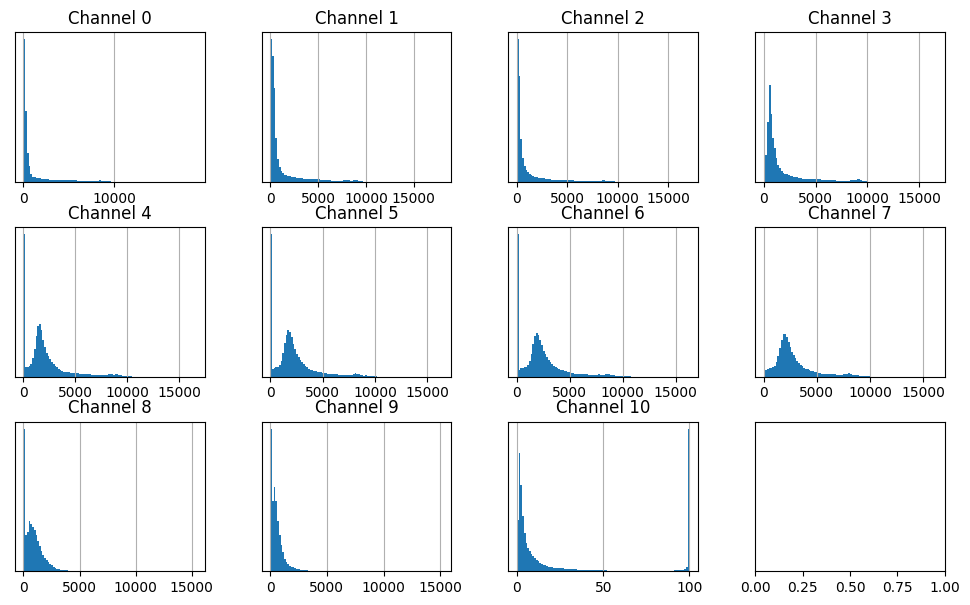

In [9]:
num_images = min(len(dataset.images), 32)
satellite = 2

num_months = 12
num_channels = 11 if satellite == 2 else 4

data_channel = {ch:[] for ch in range(num_channels)}
for i, data in enumerate(dataset.images[:num_images]):
    chip_id, X, y = data.values()
    for month in range(num_months):        
        offset = 48 + month * 11 if satellite == 2 else 0 + month * 4
        for ch in range(num_channels):
            data_channel[ch] += [X[:,:,ch + offset].flatten()]

fig, axes = plt.subplots(nrows=3 if satellite == 2 else 1, ncols=4, figsize=(12, 7 if satellite == 2 else 3))
axes = axes.flatten()
for ax in axes:
    # ax.set_xticks([])
    ax.set_yticks([])

data_summary = []
for ch,ax in zip(range(num_channels), axes):
    data_flat = np.concatenate(data_channel[ch])
    title = f'Channel {ch}'
    data_summary += [{
        'channel':ch, 'min':np.nanmin(data_flat), 
        'max':np.nanmax(data_flat), 
        'mean':np.nanmean(data_flat), 
        'std': np.nanstd(data_flat),
        'median':np.nanquantile(data_flat, .5), 
        'p99':np.nanquantile(data_flat, .99)
    }]
    df = pd.DataFrame({title:data_flat})
    df.hist(bins=100, ax=ax)

df = pd.DataFrame(data_summary)
df